In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!unzip /content/drive/MyDrive/EVA6/Capstone/detr-mine.zip -d /content/

Archive:  /content/drive/MyDrive/EVA6/Capstone/detr-mine.zip
   creating: /content/detr/
   creating: /content/detr/d2/
   creating: /content/detr/d2/configs/
  inflating: /content/detr/d2/configs/detr_256_6_6_torchvision.yaml  
  inflating: /content/detr/d2/configs/detr_segm_256_6_6_torchvision.yaml  
  inflating: /content/detr/d2/converter.py  
   creating: /content/detr/d2/detr/
  inflating: /content/detr/d2/detr/config.py  
  inflating: /content/detr/d2/detr/dataset_mapper.py  
  inflating: /content/detr/d2/detr/detr.py  
  inflating: /content/detr/d2/detr/__init__.py  
  inflating: /content/detr/d2/README.md  
  inflating: /content/detr/d2/train_net.py  
   creating: /content/detr/datasets/
   creating: /content/detr/datasets/.ipynb_checkpoints/
  inflating: /content/detr/datasets/coco.py  
  inflating: /content/detr/datasets/coco_eval.py  
  inflating: /content/detr/datasets/coco_panoptic.py  
  inflating: /content/detr/datasets/custom.py  
  inflating: /content/detr/datasets/cus

In [4]:
cd detr/

/content/detr


In [2]:
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())

1.9.0+cu111 True


In [5]:
!nvidia-smi

Mon Nov  8 18:01:49 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 495.44       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   39C    P0    27W / 250W |      2MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

Run the below block only at the begining of the First epoch. Afterwards use the weights from training model

In [ ]:
# Get pretrained weights
# checkpoint = torch.hub.load_state_dict_from_url(
#             url='https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth',
#             map_location='cpu',
#             check_hash=True)

# # Remove class weights
# del checkpoint["model"]["class_embed.weight"]
# del checkpoint["model"]["class_embed.bias"]

# # Save
# torch.save(checkpoint,
#            'detr-r50_no_class_head.pth')

Downloading: "https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth" to /root/.cache/torch/hub/checkpoints/detr-r50-e632da11.pth


  0%|          | 0.00/159M [00:00<?, ?B/s]

In [ ]:
# Get pretrained weights
checkpoint = torch.load(
            "/content/drive/MyDrive/EVA6/Capstone/outputs/checkpoint.pth",
            map_location='cpu')
# Save
torch.save(checkpoint,
           'resume_checkpoint.pth')

In [ ]:
!python main.py \
--dataset_file "custom_construction" \
--data_path "/content/drive/MyDrive/EVA6/Capstone/dataset" \
--output_dir "/content/drive/MyDrive/EVA6/Capstone/outputs" \
--resume "resume_checkpoint.pth" \
--epochs 200

# --resume "detr-r50_no_class_head.pth" \

Streaming output truncated to the last 5000 lines.
Epoch: [192]  [ 490/5073]  eta: 0:18:40  lr: 0.000100  class_error: 20.00  loss: 2.7190 (3.4960)  loss_ce: 0.1514 (0.2005)  loss_bbox: 0.1363 (0.1810)  loss_giou: 0.1403 (0.1649)  loss_ce_0: 0.1422 (0.2599)  loss_bbox_0: 0.1571 (0.2035)  loss_giou_0: 0.1370 (0.1837)  loss_ce_1: 0.1863 (0.2506)  loss_bbox_1: 0.1296 (0.1858)  loss_giou_1: 0.1214 (0.1690)  loss_ce_2: 0.1587 (0.2336)  loss_bbox_2: 0.1430 (0.1844)  loss_giou_2: 0.1555 (0.1674)  loss_ce_3: 0.0954 (0.2144)  loss_bbox_3: 0.1453 (0.1819)  loss_giou_3: 0.1293 (0.1643)  loss_ce_4: 0.1170 (0.2081)  loss_bbox_4: 0.1496 (0.1801)  loss_giou_4: 0.1307 (0.1629)  loss_ce_unscaled: 0.1514 (0.2005)  class_error_unscaled: 12.5000 (14.6469)  loss_bbox_unscaled: 0.0273 (0.0362)  loss_giou_unscaled: 0.0702 (0.0824)  cardinality_error_unscaled: 2.0000 (2.2200)  loss_ce_0_unscaled: 0.1422 (0.2599)  loss_bbox_0_unscaled: 0.0314 (0.0407)  loss_giou_0_unscaled: 0.0685 (0.0919)  cardinality_error_0

In [ ]:
# !python test.py \
# --dataset_file "custom_construction" \
# --data_path "/content/drive/MyDrive/EVA6/Capstone/dataset" \
# --resume "/content/drive/MyDrive/EVA6/Capstone/outputs/checkpoint.pth" 

# --num_classes $num_classes \


In [7]:
from util.plot_utils import plot_logs

from pathlib import Path

log_directory = [Path('/content/drive/MyDrive/EVA6/Capstone/outputs/')]

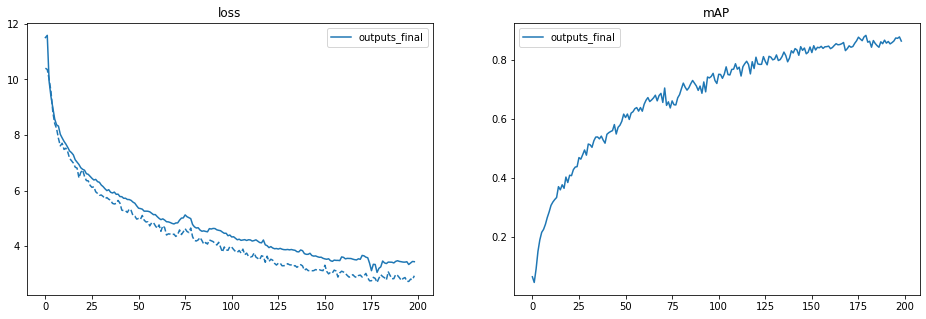

In [8]:
fields_of_interest = (
    'loss',
    'mAP',
    )

plot_logs(log_directory,
          fields_of_interest)

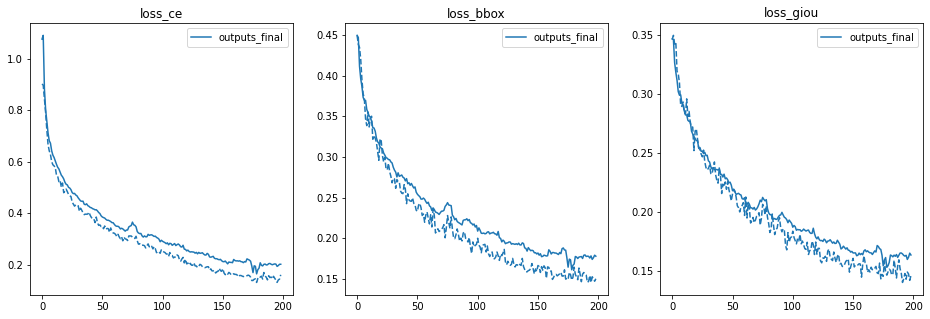

In [9]:
fields_of_interest = (
    'loss_ce',
    'loss_bbox',
    'loss_giou',
    )

plot_logs(log_directory,
          fields_of_interest)

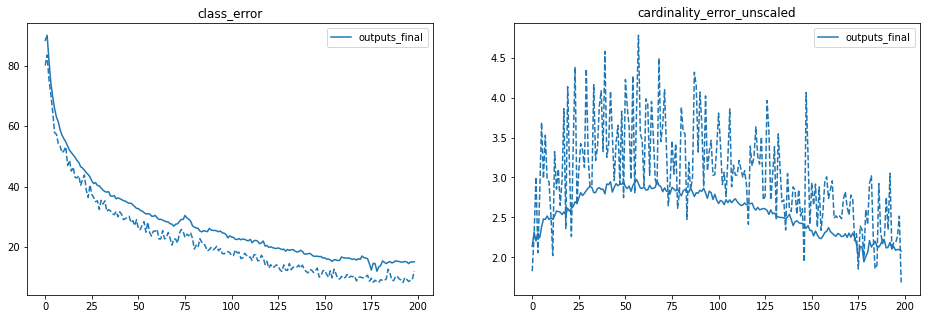

In [10]:
fields_of_interest = (
    'class_error',
    'cardinality_error_unscaled',
    )

plot_logs(log_directory,
          fields_of_interest)  

In [11]:
torch.set_grad_enabled(False);

model = torch.hub.load('facebookresearch/detr',
                       'detr_resnet50',
                       pretrained=False,
                       num_classes=65)

checkpoint = torch.load('/content/drive/MyDrive/EVA6/Capstone/outputs/checkpoint.pth',
                        map_location='cpu')

model.load_state_dict(checkpoint['model'],
                      strict=False)

model.eval();



Downloading: "https://github.com/facebookresearch/detr/archive/master.zip" to /root/.cache/torch/hub/master.zip
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

In [12]:
import torchvision.transforms as T

# standard PyTorch mean-std input image normalization
transform = T.Compose([
    T.Resize(800),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# for output bounding box post-processing
def box_cxcywh_to_xyxy(x):
    x_c, y_c, w, h = x.unbind(1)
    b = [(x_c - 0.5 * w), (y_c - 0.5 * h),
         (x_c + 0.5 * w), (y_c + 0.5 * h)]
    return torch.stack(b, dim=1)

def rescale_bboxes(out_bbox, size):
    img_w, img_h = size
    b = box_cxcywh_to_xyxy(out_bbox)
    b = b * torch.tensor([img_w, img_h, img_w, img_h], dtype=torch.float32)
    return b    

In [13]:
def filter_bboxes_from_outputs(outputs,
                               threshold=0.7):
  
  # keep only predictions with confidence above threshold
  probas = outputs['pred_logits'].softmax(-1)[0, :, :-1]
  keep = probas.max(-1).values > threshold

  probas_to_keep = probas[keep]

  # convert boxes from [0; 1] to image scales
  bboxes_scaled = rescale_bboxes(outputs['pred_boxes'][0, keep], im.size)
  
  return probas_to_keep, bboxes_scaled

In [14]:
# colors for visualization
COLORS = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
          [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]

# COCO classes
finetuned_classes = [
"N/A","misc", "water", "ground", "solid", "sky",
"plant", "structural", "building", "food", "textile",
"furniture", "window", "floor", "ceiling", "wall", "rawmaterial",
"aac_blocks", "adhesives", "ahus", "aluminium_frames_for_false_ceiling", "chiller",
"concrete_mixer_machine", "concrete_pump", "control_panel", "cu_piping", "distribution_transformer",
"dump_truck_tipper_truck", "emulsion_paint", "enamel_paint","fine_aggregate", "fire_buckets",
"fire_extinguishers", "glass_wool","grader", "hoist","hollow_concrete_blocks",
"hot_mix_plant", "hydra_crane","interlocked_switched_socket","junction_box","lime",
"marble", "metal_primer", "pipe_fittings", "rcc_hume_pipes", "refrigerant_gas",
"river_sand", "rmc_batching_plant", "rmu_units", "sanitary_fixtures",
"skid_steer_loader", "smoke_detectors", "split_units", "structural_steel_channel",
"switch_boards_and_switches",  "texture_paint", "threaded_rod", "transit_mixer", "vcb_panel",
"vitrified_tiles", "vrf_units", "water_tank", "wheel_loader", "wood_primer"
]         

In [15]:
import matplotlib.pyplot as plt

def plot_finetuned_results(pil_img, prob=None, boxes=None):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    colors = COLORS * 100
    if prob is not None and boxes is not None:
      for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), colors):
          ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                    fill=False, color=c, linewidth=3))
          cl = p.argmax()
          text = f'{finetuned_classes[cl]}: {p[cl]:0.2f}'
          ax.text(xmin, ymin, text, fontsize=15,
                  bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.show()

In [16]:
def run_worflow(my_image, my_model):
  # mean-std normalize the input image (batch-size: 1)
  img = transform(my_image).unsqueeze(0)

  # propagate through the model
  outputs = my_model(img)

  for threshold in [0.9, 0.75]:
    
    probas_to_keep, bboxes_scaled = filter_bboxes_from_outputs(outputs,
                                                              threshold=threshold)

    plot_finetuned_results(my_image,
                           probas_to_keep, 
                           bboxes_scaled)

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
/usr/local/lib/python3.7/dist-packages/torch/_tensor.py:575: UserWarning: floor_divide is deprecated, and will be removed in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values.
To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor'). (Triggered internally at  /pytorch/aten/src/ATen/native/BinaryOps.cpp:467.)
  return torch.floor_divide(self, other)


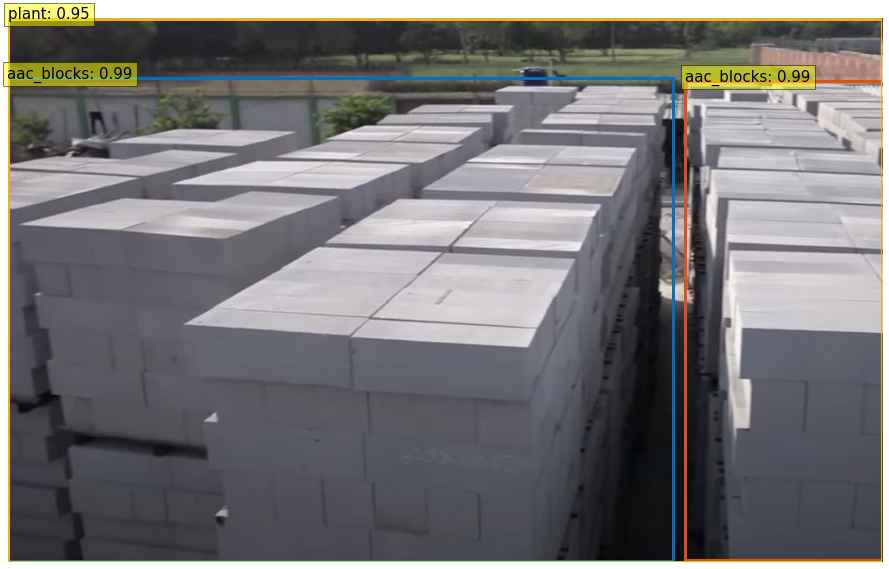

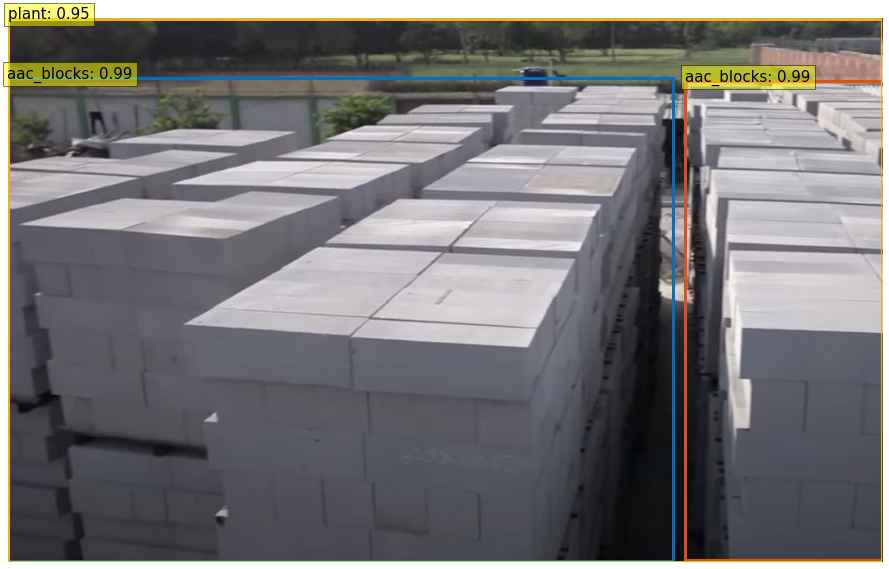

In [17]:
from PIL import Image

img_name = '/content/drive/MyDrive/EVA6/Capstone/dataset/images/aac_blocks_1.jpg'
im = Image.open(img_name)

run_worflow(im,
            model)

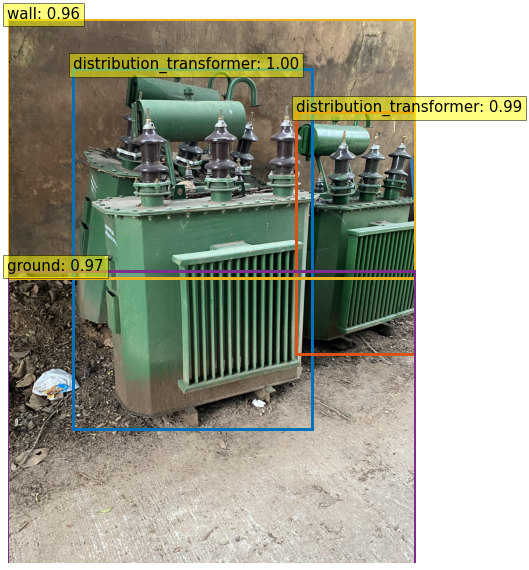

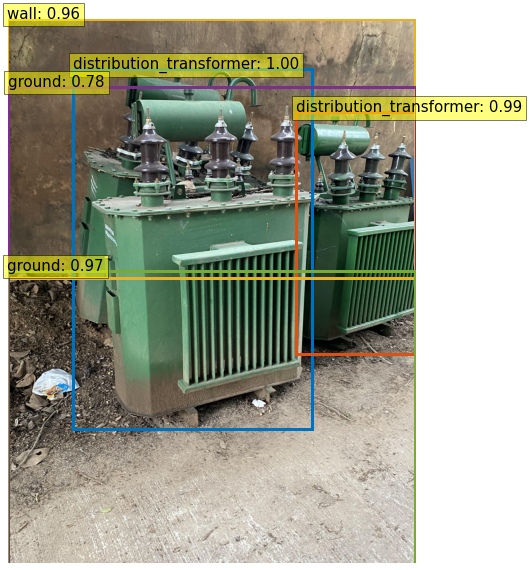

In [18]:
from PIL import Image

img_name = '/content/drive/MyDrive/EVA6/Capstone/dataset/images/distribution_transformer_1471.jpg'
im = Image.open(img_name)

run_worflow(im,
            model)

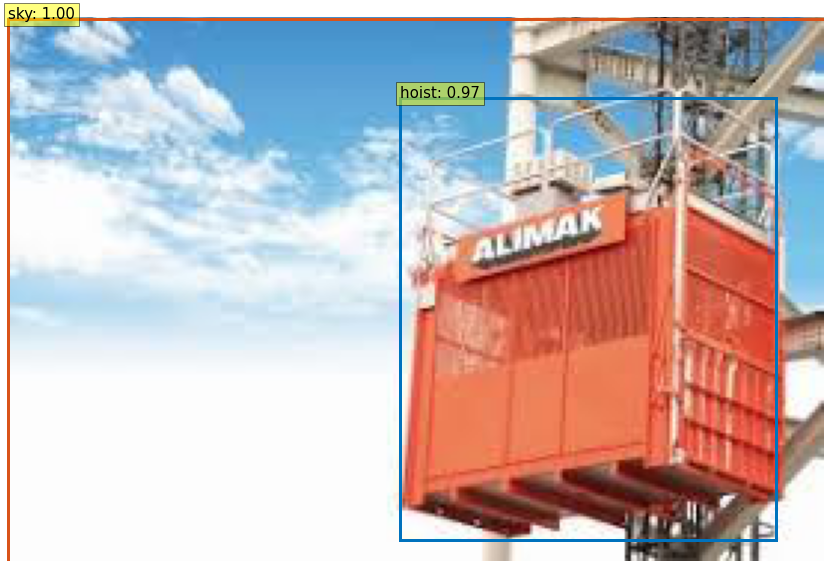

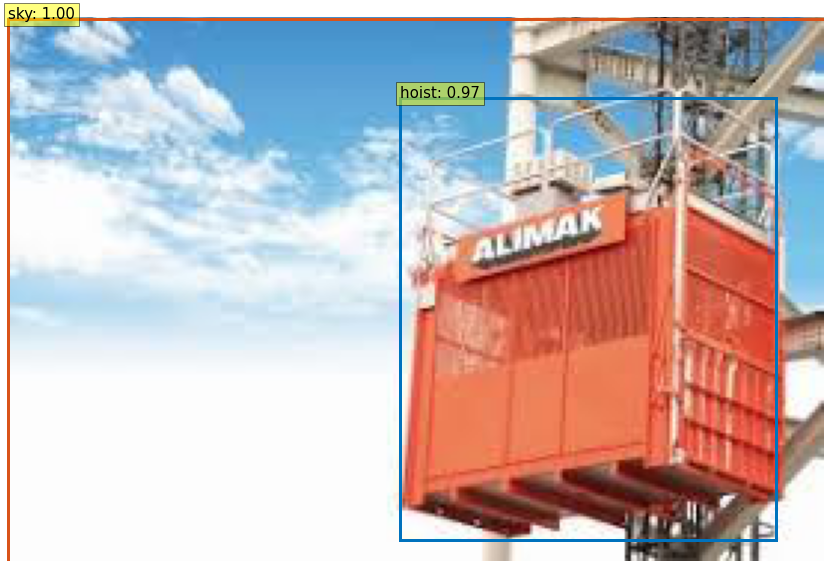

In [30]:
from PIL import Image

img_name = '/content/drive/MyDrive/EVA6/Capstone/dataset/images/hoist_3637.jpg'
im = Image.open(img_name)

run_worflow(im,
            model)

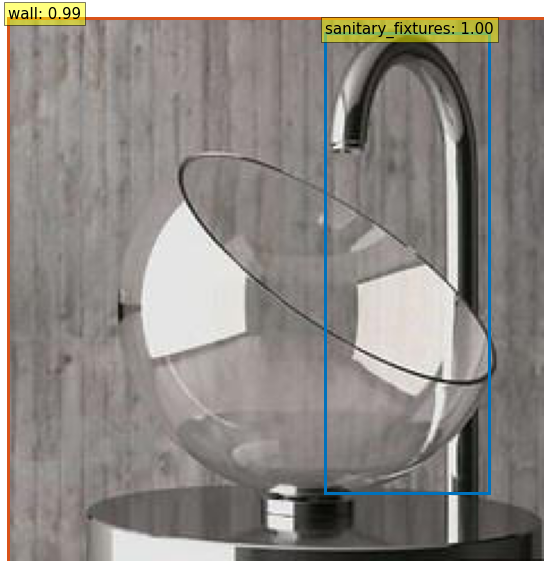

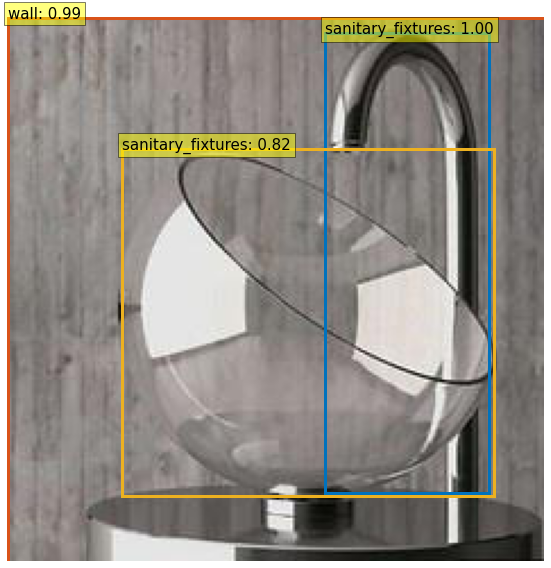

In [38]:
from PIL import Image

img_name = '/content/drive/MyDrive/EVA6/Capstone/dataset/images/sanitary_fixtures_6014.jpg'
im = Image.open(img_name)

run_worflow(im,
            model)

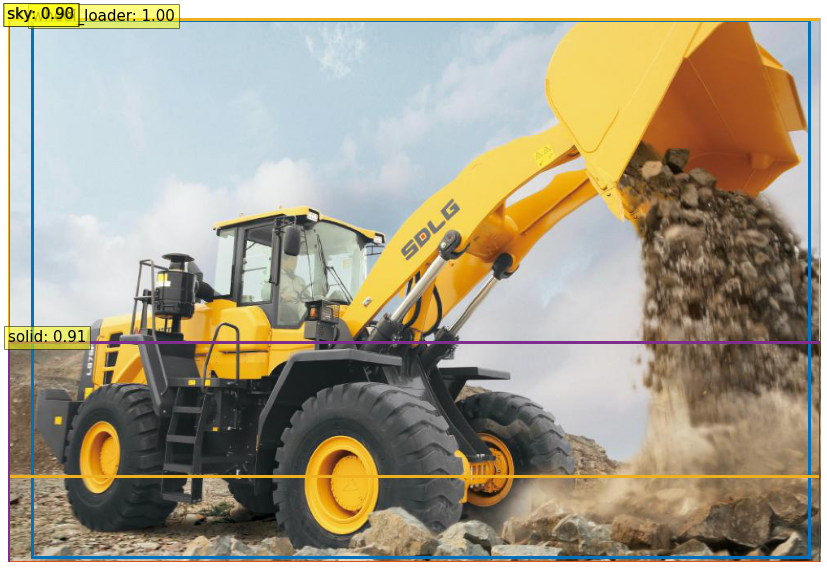

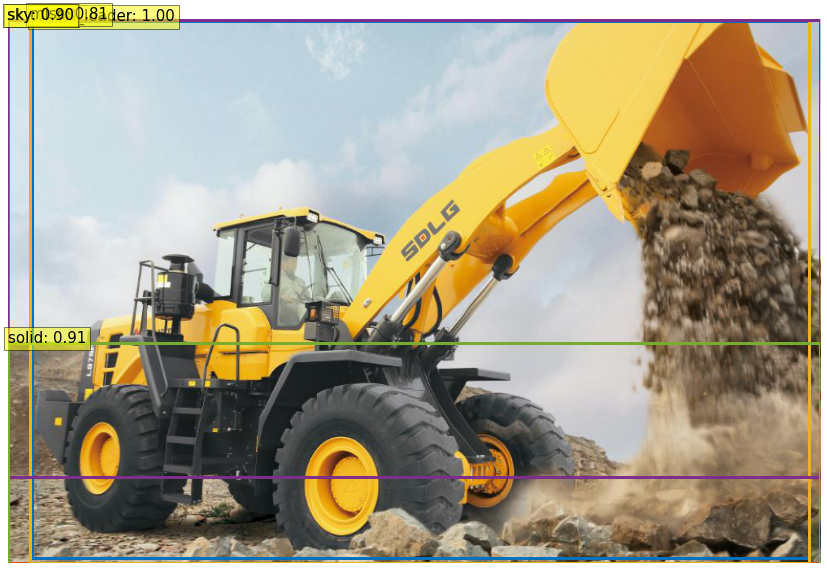

In [45]:
from PIL import Image

img_name = '/content/drive/MyDrive/EVA6/Capstone/dataset/images/wheel_loader_9998.jpg'
im = Image.open(img_name)

run_worflow(im,
            model)